In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai.vision import *
from fastai.callbacks.hooks import *
from fastai.utils.mem import *
import os
from pathlib import Path
import cv2
import shutil 
from PIL import Image
from numpy import asarray

In [3]:
#getting the subset of train and validation set images of person and and their annotations
path = Path('E:/STUDY/fastai/Pytorch/Coco')
train_dir = Path('E:/STUDY/fastai/Pytorch/Coco/train2017_new')
val_dir = Path('E:/STUDY/fastai/Pytorch/Coco/val2017_new')
train_ann = Path('E:/STUDY/fastai/Pytorch/Coco/train2017_ann')
val_ann = Path('E:/STUDY/fastai/Pytorch/Coco/val2017_ann')

In [4]:
fnames = get_image_files(train_dir)
fnames[:3]

[WindowsPath('E:/STUDY/fastai/Pytorch/Coco/train2017_new/000000000036.jpg'),
 WindowsPath('E:/STUDY/fastai/Pytorch/Coco/train2017_new/000000000049.jpg'),
 WindowsPath('E:/STUDY/fastai/Pytorch/Coco/train2017_new/000000000061.jpg')]

E:\STUDY\fastai\Pytorch\Coco\train2017_


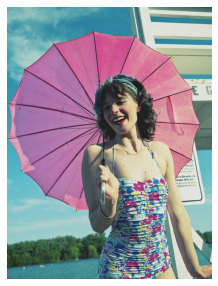

In [5]:
img_f = fnames[0]
img = open_image(img_f)
img.show(figsize=(5,5))
print(str(fnames[0]).split('new')[0])

In [6]:
get_y_fn = lambda x :  str(x).split('new')[0]+"ann"+str(x).split('new')[1]

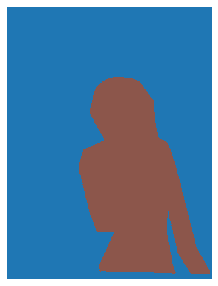

In [7]:
mask = open_mask(get_y_fn(img_f))
mask.show(figsize=(5,5),alpha = 1)

In [8]:
src_size = np.array(mask.shape[1:])
src_size,torch.unique(mask.data)

(array([640, 481]), tensor([0, 1, 2]))

In [9]:
size = [128,128]

free = gpu_mem_get_free_no_cache()
# the max size of bs depends on the available GPU RAM
if free > 8200: bs=8
else:           bs=4
print(f"using bs={bs}, have {free}MB of GPU RAM free")
size                        

using bs=4, have 1015MB of GPU RAM free


[128, 128]

In [10]:
codes = np.loadtxt(Path('E:/STUDY/fastai/Pytorch/Coco/codes.txt'), dtype=str); codes

array(['person', 'bicycle', 'car', 'motorcycle', ..., 'scissors', 'teddy_bear', 'hair_drier', 'toothbrush'],
      dtype='<U14')

In [11]:
src = SegmentationItemList.from_folder(path=path)
src = src.split_by_folder(train = 'train2017_new',valid = 'val2017_new')
src = src.label_from_func(get_y_fn, classes=codes)
src

LabelLists;

Train: LabelList (64115 items)
x: SegmentationItemList
Image (3, 640, 481),Image (3, 500, 381),Image (3, 488, 640),Image (3, 426, 640),Image (3, 375, 500)
y: SegmentationLabelList
ImageSegment (1, 640, 481),ImageSegment (1, 500, 381),ImageSegment (1, 488, 640),ImageSegment (1, 426, 640),ImageSegment (1, 375, 500)
Path: E:\STUDY\fastai\Pytorch\Coco;

Valid: LabelList (2693 items)
x: SegmentationItemList
Image (3, 426, 640),Image (3, 425, 640),Image (3, 640, 621),Image (3, 427, 640),Image (3, 480, 640)
y: SegmentationLabelList
ImageSegment (1, 426, 640),ImageSegment (1, 425, 640),ImageSegment (1, 640, 621),ImageSegment (1, 427, 640),ImageSegment (1, 480, 640)
Path: E:\STUDY\fastai\Pytorch\Coco;

Test: None

In [22]:
data = (src.transform(get_transforms(), size=size, tfm_y=True)
        .databunch(bs=16)
        .normalize(imagenet_stats))

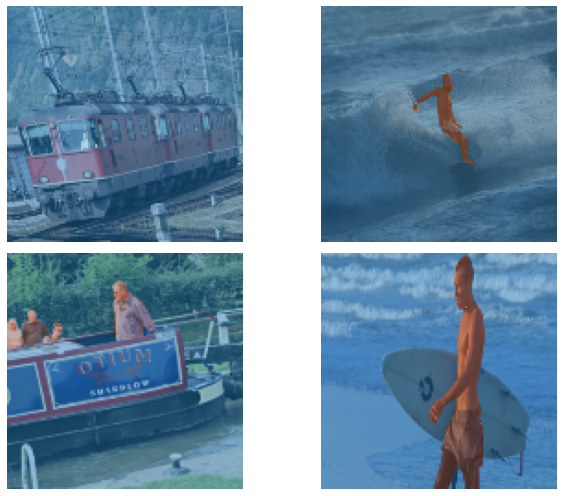

In [23]:
data.show_batch(2, figsize=(10,7))

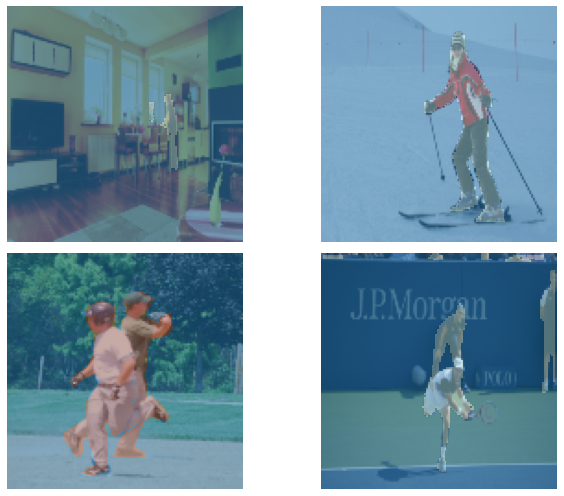

In [122]:
data.show_batch(2, figsize=(10,7), ds_type=DatasetType.Valid)

In [23]:
metrics=accuracy

In [24]:
wd=1e-2

In [25]:
learn = unet_learner(data, models.resnet34, metrics=[dice], wd=wd)

In [39]:
learn.destroy()

this Learner object self-destroyed - it still exists, but no longer usable


epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


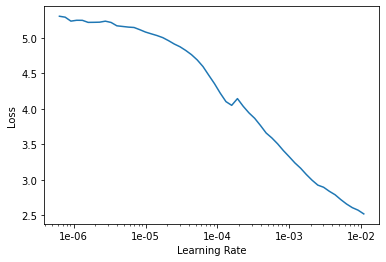

In [134]:
lr_find(learn)
learn.recorder.plot()

In [28]:
lr=3e-3

In [41]:
learn.fit_one_cycle(10, slice(lr))

epoch,train_loss,valid_loss,dice,time
0,0.175736,0.157502,0.613068,1:07:49
1,0.162843,0.146984,0.639005,57:11
2,0.155813,0.145026,0.622639,57:33
3,0.150896,0.151372,0.580641,54:54
4,0.151620,0.138295,0.646982,57:37
5,0.142304,0.133946,0.646605,57:30
6,0.139871,0.132227,0.656946,57:09
7,0.126864,0.130805,0.656547,55:55
8,0.120403,0.126422,0.663348,54:42
9,0.118585,0.126391,0.666086,54:43


In [43]:
learn.save('stage1-bgremove-small')

In [26]:
learn.load('stage1-bgremove-small')

Learner(data=ImageDataBunch;

Train: LabelList (64115 items)
x: SegmentationItemList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: SegmentationLabelList
ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128)
Path: E:\STUDY\fastai\Pytorch\Coco;

Valid: LabelList (2693 items)
x: SegmentationItemList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: SegmentationLabelList
ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128)
Path: E:\STUDY\fastai\Pytorch\Coco;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): R

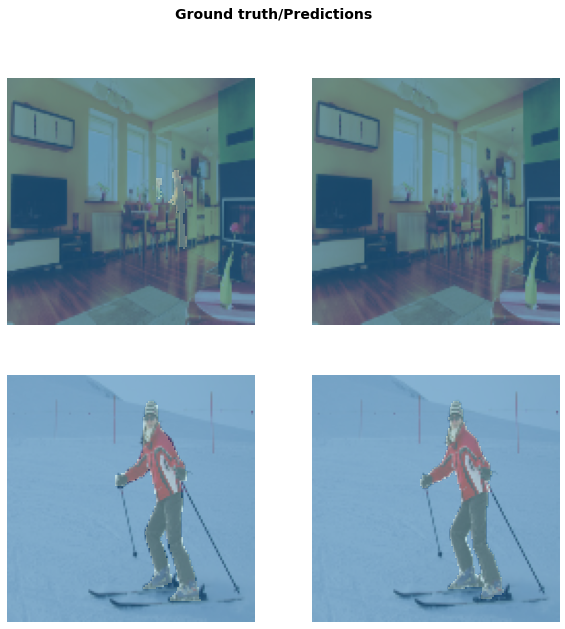

In [47]:
learn.show_results(rows = 2, figsize = (10,10))

In [59]:
data = (src.transform(get_transforms(), size = size, tfm_y = True)
        .databunch(bs = 16)
        .normalize(imagenet_stats))

In [60]:
learn.destroy()

this Learner object self-destroyed - it still exists, but no longer usable


In [61]:
learn = unet_learner(data, models.resnet34, metrics = [dice], wd = 0.1)

In [41]:
learn.load('stage1-bgremove-small')

Learner(data=ImageDataBunch;

Train: LabelList (64115 items)
x: SegmentationItemList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: SegmentationLabelList
ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128)
Path: E:\STUDY\fastai\Pytorch\Coco;

Valid: LabelList (2693 items)
x: SegmentationItemList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: SegmentationLabelList
ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128),ImageSegment (1, 128, 128)
Path: E:\STUDY\fastai\Pytorch\Coco;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): R

epoch,train_loss,valid_loss,dice,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


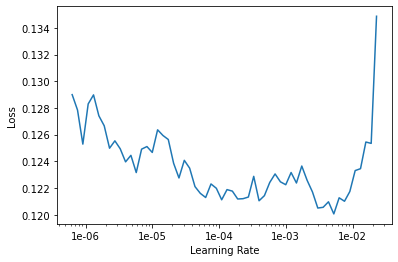

In [63]:
lr_find(learn)
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(10,slice(lr))

epoch,train_loss,valid_loss,dice,time
0,0.127896,0.131780,0.670329,1:10:59
1,0.147636,0.137505,0.657391,1:42:02
2,0.160632,0.145177,0.654955,1:16:43


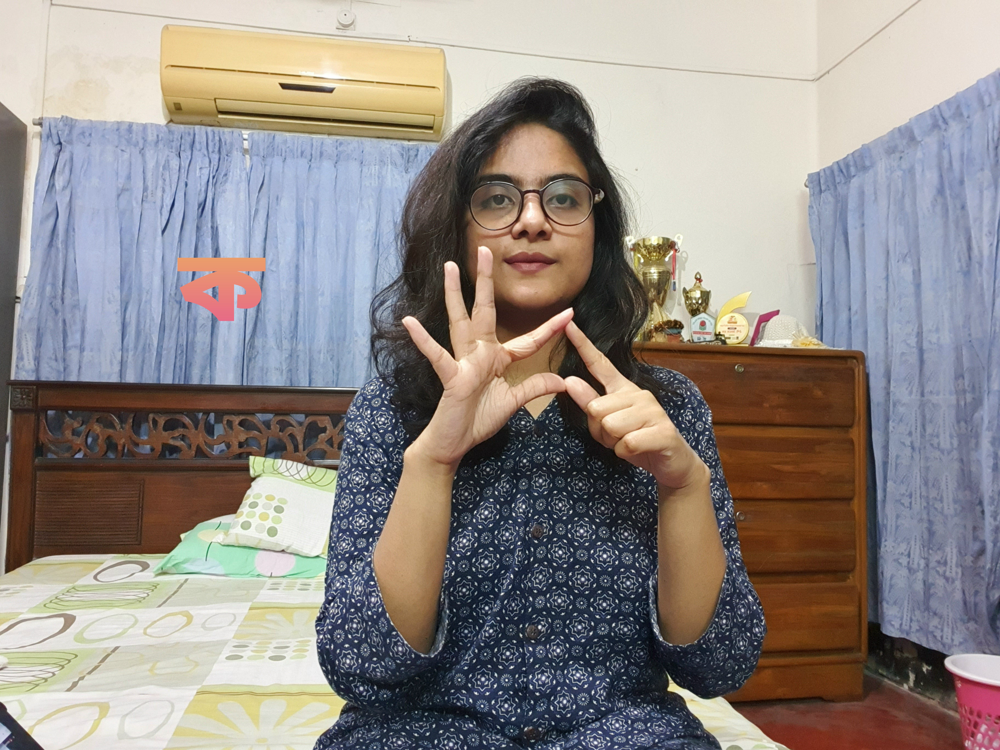

In [18]:
img = open_image("E:\\STUDY\\fastai\\Pytorch\\6.jpg")
img

In [19]:
defaults.device = torch.device('cpu')

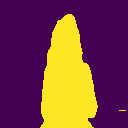

In [27]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

In [32]:
import cv2 as cv
from PIL import Image
from torchvision import transforms
from numpy import asarray
im_color = cv.imread("E:\\STUDY\\fastai\\Pytorch\\6.jpg")
im_color = cv.resize(im_color, (128,128), interpolation = cv2.INTER_AREA)

In [33]:
img3 = np.zeros((128,128,3))
#pred_idx[)][1][5]
for i in range(128):
    for j in range(128):
        for k in range(3):
            img3[i][j][k] = pred_idx[0][i][j]*im_color[i][j][k]

In [36]:
cv2.imwrite('E:\\STUDY\\fastai\\Pytorch\\cv2.png',img3)

True

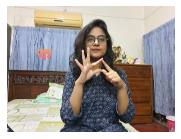

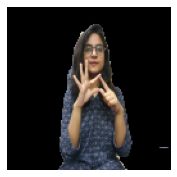

In [40]:
import matplotlib.pyplot as plt

# read images
img_A = open_image("E:\\STUDY\\fastai\\Pytorch\\6.jpg")
img_B = open_image("E:\\STUDY\\fastai\\Pytorch\\cv2.png")

# display images
#fig, ax = plt.subplots(1,2)
img_A.show();
img_B.show();